In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from ipyleaflet import Map
import folium
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime


## Obtain

In [83]:
df_2018 = pd.read_csv('Crime_Incidents_in_2018.csv')

In [84]:
df_2019 = pd.read_csv('Crime_Incidents_in_2019.csv')

## Data Cleaning

In [85]:
display(df_2018.head(1))
display(df_2019.head(1))

,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,BLOCK_GROUP,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID
0,-77.014559,38.94219,18217166,2018-12-22T21:10:50.000Z,EVENING,OTHERS,THEFT/OTHER,200 - 299 BLOCK OF UPSHUR STREET NW,398738.0,141588.0,...,002301 2,2301.0,Precinct 45,38.942182,-77.014557,NaN,2018-12-22T19:12:20.000Z,2018-12-22T19:14:03.000Z,329684676,18217166-01


,X,Y,CCN,REPORT_DAT,SHIFT,METHOD,OFFENSE,BLOCK,XBLOCK,YBLOCK,...,BLOCK_GROUP,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,BID,START_DATE,END_DATE,OBJECTID,OCTO_RECORD_ID
0,-77.017646,38.87787,18220657,2019-01-05T11:31:29.000Z,DAY,OTHERS,THEFT F/AUTO,900 - 1199 BLOCK OF 4TH STREET SW,398469.0,134448.0,...,010200 2,10200.0,Precinct 142,38.877862,-77.017644,SOUTHWEST,2018-12-29T14:15:38.000Z,2018-12-29T14:50:43.000Z,330087706,18220657-01


In [86]:
print(df_2018.shape)
print(df_2019.shape)

(33782, 25)
(20620, 25)


Let's combine our datasets:

In [87]:
df = df_2018.append(df_2019)
df.shape

(54402, 25)

Let's check for null values in the remaining data: 

In [88]:
df.isna().sum()

X                           0
Y                           0
CCN                         0
REPORT_DAT                  0
SHIFT                       0
METHOD                      0
OFFENSE                     0
BLOCK                       0
XBLOCK                      0
YBLOCK                      0
WARD                        0
ANC                         0
DISTRICT                   13
PSA                        13
NEIGHBORHOOD_CLUSTER      624
BLOCK_GROUP               111
CENSUS_TRACT              111
VOTING_PRECINCT             0
LATITUDE                    0
LONGITUDE                   0
BID                     44138
START_DATE                  0
END_DATE                 9556
OBJECTID                    0
OCTO_RECORD_ID              0
dtype: int64

For the EDA phase, we'll be focusing on the types of crimes committed by geographic location as well as frequency of crimes over time frames. Given this, let's remove some of the unnecessary columns:

In [89]:
df = df.drop(columns=['X', 'Y', 'CCN', 'BLOCK', 'XBLOCK', 'YBLOCK', 'ANC', 'PSA', 
                      'BID', 'START_DATE', 'END_DATE'])

With our dataset slimmed down, let's add a few additional columns to help with our visual analysis in Tableau. We'll add a count measure for totaling crime incidents, as well as a city and state column for Tableau's mapping feature: 

In [90]:
df['COUNT'] = 1

In [91]:
df['CITY'] = 'Washington, DC'

In [92]:
df['STATE'] = 'District of Columbia'

For our time related analysis we'll need to separate the 'REPORT_DAT' column into two separate columns for both the date and time:

In [93]:
new = df['REPORT_DAT'].str.split('T', n=1, expand = True)

In [94]:
new.head()

,0,1
0,2018-12-22,21:10:50.000Z
1,2018-12-22,20:29:36.000Z
2,2018-12-23,03:38:37.000Z
3,2018-12-22,21:00:57.000Z
4,2018-12-22,20:49:59.000Z


In [95]:
df['DATE'] = new[0] 

In [96]:
time = new[1].str.split('.', n=1, expand = True)

In [97]:
time.head()

,0,1
0,21:10:50,000Z
1,20:29:36,000Z
2,03:38:37,000Z
3,21:00:57,000Z
4,20:49:59,000Z


In [98]:
df['TIME'] = time[0]

In [99]:
df.head()

,REPORT_DAT,SHIFT,METHOD,OFFENSE,WARD,DISTRICT,NEIGHBORHOOD_CLUSTER,BLOCK_GROUP,CENSUS_TRACT,VOTING_PRECINCT,LATITUDE,LONGITUDE,OBJECTID,OCTO_RECORD_ID,COUNT,CITY,STATE,DATE,TIME
0,2018-12-22T21:10:50.000Z,EVENING,OTHERS,THEFT/OTHER,4,4.0,Cluster 18,002301 2,2301.0,Precinct 45,38.942182,-77.014557,329684676,18217166-01,1,"Washington, DC",District of Columbia,2018-12-22,21:10:50
1,2018-12-22T20:29:36.000Z,EVENING,OTHERS,THEFT/OTHER,6,1.0,Cluster 27,007200 2,7200.0,Precinct 131,38.876999,-77.004356,329684677,18217171-01,1,"Washington, DC",District of Columbia,2018-12-22,20:29:36
2,2018-12-23T03:38:37.000Z,MIDNIGHT,OTHERS,THEFT/OTHER,7,6.0,Cluster 32,009603 3,9603.0,Precinct 102,38.890214,-76.952775,329684678,18217172-01,1,"Washington, DC",District of Columbia,2018-12-23,03:38:37
3,2018-12-22T21:00:57.000Z,EVENING,OTHERS,MOTOR VEHICLE THEFT,7,6.0,Cluster 33,007803 3,7803.0,Precinct 98,38.890241,-76.935370,329684679,18217180-01,1,"Washington, DC",District of Columbia,2018-12-22,21:00:57
4,2018-12-22T20:49:59.000Z,EVENING,OTHERS,THEFT F/AUTO,2,1.0,Cluster 8,005800 2,5800.0,Precinct 129,38.900860,-77.020912,329684680,18217182-01,1,"Washington, DC",District of Columbia,2018-12-22,20:49:59


Next we'll convert our new 'DATE' column to a datetime data type from it's current object form:

In [100]:
df['DATE'] = pd.to_datetime(df['DATE'], format= '%Y-%m-%d')

In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54402 entries, 0 to 20619
Data columns (total 19 columns):
REPORT_DAT              54402 non-null object
SHIFT                   54402 non-null object
METHOD                  54402 non-null object
OFFENSE                 54402 non-null object
WARD                    54402 non-null int64
DISTRICT                54389 non-null float64
NEIGHBORHOOD_CLUSTER    53778 non-null object
BLOCK_GROUP             54291 non-null object
CENSUS_TRACT            54291 non-null float64
VOTING_PRECINCT         54402 non-null object
LATITUDE                54402 non-null float64
LONGITUDE               54402 non-null float64
OBJECTID                54402 non-null int64
OCTO_RECORD_ID          54402 non-null object
COUNT                   54402 non-null int64
CITY                    54402 non-null object
STATE                   54402 non-null object
DATE                    54402 non-null datetime64[ns]
TIME                    54402 non-null object
dtypes: 

As a last step, let's address the columns containing the null values. We'll first check the percentage of null values for each column: 

In [102]:
display(df.isna().sum() / len(df) * 100)
display(df.shape)

REPORT_DAT              0.000000
SHIFT                   0.000000
METHOD                  0.000000
OFFENSE                 0.000000
WARD                    0.000000
DISTRICT                0.023896
NEIGHBORHOOD_CLUSTER    1.147017
BLOCK_GROUP             0.204037
CENSUS_TRACT            0.204037
VOTING_PRECINCT         0.000000
LATITUDE                0.000000
LONGITUDE               0.000000
OBJECTID                0.000000
OCTO_RECORD_ID          0.000000
COUNT                   0.000000
CITY                    0.000000
STATE                   0.000000
DATE                    0.000000
TIME                    0.000000
dtype: float64

(54402, 19)

Because the percentage of missing values in our columns are each below 3%, we'll go ahead and remove these rows entirely without losing too much data:

In [103]:
df = df.dropna(axis = 0, how = 'any')

In [104]:
display(df.isna().sum() / len(df) * 100)
display(df.shape)

REPORT_DAT              0.0
SHIFT                   0.0
METHOD                  0.0
OFFENSE                 0.0
WARD                    0.0
DISTRICT                0.0
NEIGHBORHOOD_CLUSTER    0.0
BLOCK_GROUP             0.0
CENSUS_TRACT            0.0
VOTING_PRECINCT         0.0
LATITUDE                0.0
LONGITUDE               0.0
OBJECTID                0.0
OCTO_RECORD_ID          0.0
COUNT                   0.0
CITY                    0.0
STATE                   0.0
DATE                    0.0
TIME                    0.0
dtype: float64

(53654, 19)

Finally, we'll save our cleaned dataset to a new csv file for later use in the modeling portion:

In [105]:
df.to_csv('Crime_data_final.csv')

## Exploratory Data Analysis

For the exploratory analysis phase, we're going to employ the application Tableau to produce meaningful insights into the types of crimes committed, the location of these crimes, as well as the distribution of crime incidents across data/time metrics.

For these graphics, we're going to limit the time frame to July 2018 - July 2019. We'll start by looking at the number of crimes committed by crime type:

(Note: viewers can hover over the visualizations for additional clarity)

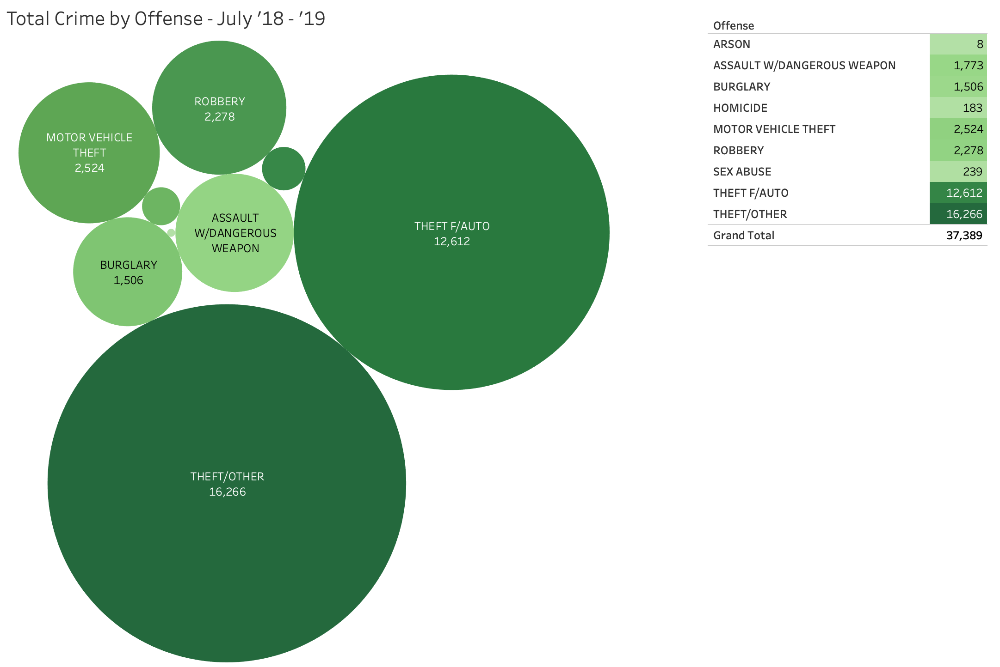

In [36]:
Image(filename = 'DC Crime by Type.png', width=900, height=900, )

**Time and Data Analysis**

Let's take a look at the total crimes that occurred by month with the percentage change from the previous month:

In [37]:
%%HTML

<div class='tableauPlaceholder' id='viz1566868331634' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalbyMonth&#47;TotalCrimebyMonth&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='TotalbyMonth&#47;TotalCrimebyMonth' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalbyMonth&#47;TotalCrimebyMonth&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1566868331634');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Next, we break down the number of crime incidents by weekday to see if certain days contain higher crime rates than others. I have included a percent of total calculation for easy comparison:

In [38]:
%%HTML
<div class='tableauPlaceholder' id='viz1566868417921' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalbyWeekday&#47;TotalbyWeekday&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='TotalbyWeekday&#47;TotalbyWeekday' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalbyWeekday&#47;TotalbyWeekday&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1566868417921');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>


Next, we take a look at the number of crimes committed by time of day to extract peak times:

In [39]:
%%HTML

<div class='tableauPlaceholder' id='viz1566868466067' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalCrimebyHour&#47;TotalbyHour&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='TotalCrimebyHour&#47;TotalbyHour' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;To&#47;TotalCrimebyHour&#47;TotalbyHour&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1566868466067');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>


**Geographic Analysis**

Let's take a look at the volume of DC crime by city ward. We'll import a map outlining the geographic location of DC's wards for reference: 

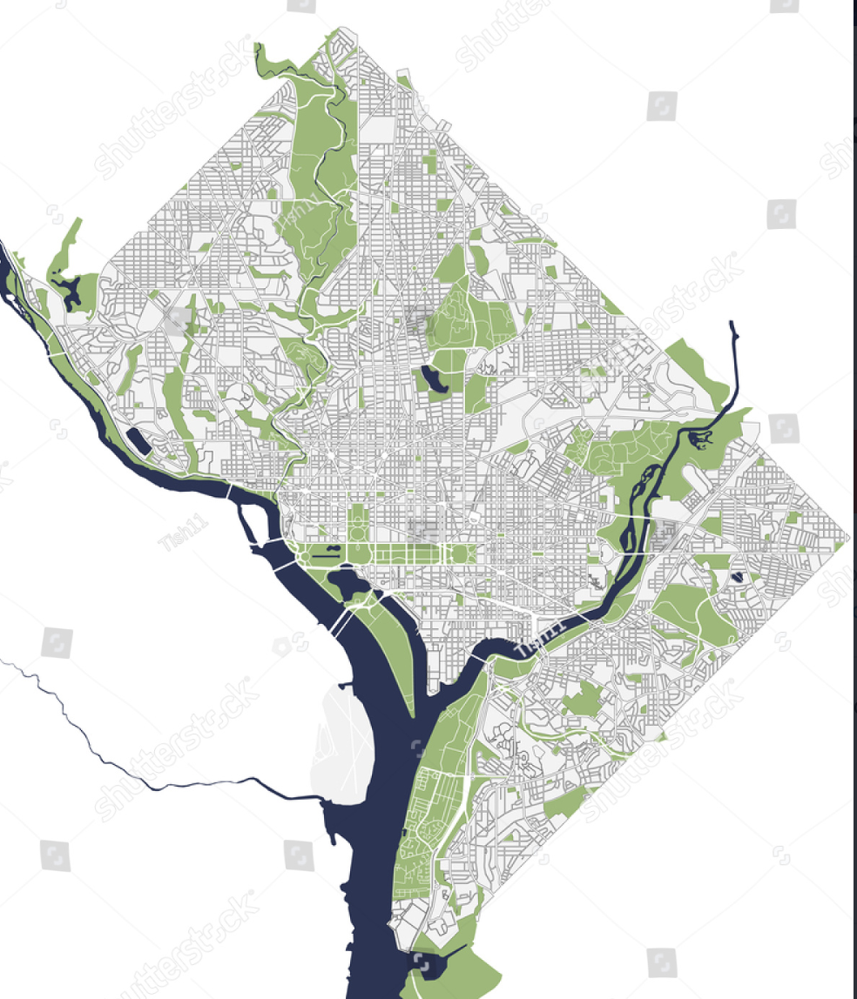

In [40]:
Image(filename = 'DC Map.png',
      width=500, height=500, )

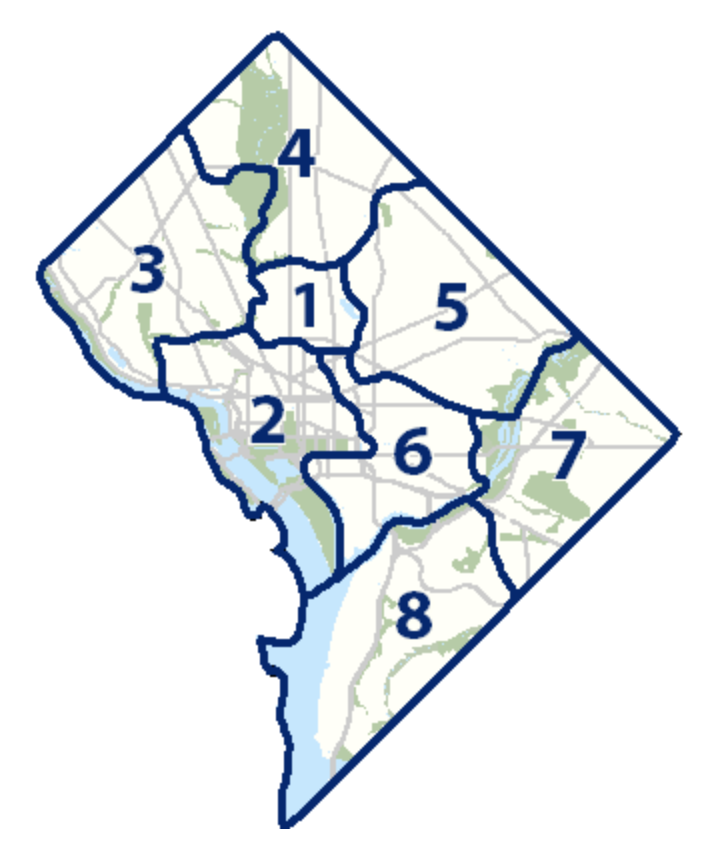

In [41]:
Image(filename = 'DC Wards.png',
      width=500, height=500, )

In [2]:
dc_map = folium.Map(location=[38.9072, -77.0369], zoom_start = 12, tiles = "Stamen Terrain")

folium.Marker([38.89722, -77.03654], popup = 'White House').add_to(dc_map)
folium.Marker([38.88968, -77.00937], popup = 'U.S. Capitol').add_to(dc_map)

dc_map

Because our EDA visualizations encompass data from July 2018 - July 2019, we'll need to create a new data frame with the filtered dates for our seaborn/matplotlib visuals. We'll do that now before plotting:

In [23]:
df = pd.read_csv('Crime_data_final.csv')
df.drop(columns = 'Unnamed: 0', inplace = True)

In [24]:
df['DATE'] = pd.to_datetime(df['DATE'], format= '%Y-%m-%d')

In [25]:
df_f = df.where((df['DATE'] > '2018-06-30') & (df['DATE'] < '2019-07-01')) 
display(df_f['DATE'].min())
display(df_f['DATE'].max())

Timestamp('2018-07-01 00:00:00')

Timestamp('2019-06-30 00:00:00')

In [26]:
df_f.dropna(inplace=True)

In [27]:
df_f['DATE'] = df_f['DATE'].astype(str)
df_f.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33901 entries, 0 to 53405
Data columns (total 19 columns):
REPORT_DAT              33901 non-null object
SHIFT                   33901 non-null object
METHOD                  33901 non-null object
OFFENSE                 33901 non-null object
WARD                    33901 non-null float64
DISTRICT                33901 non-null float64
NEIGHBORHOOD_CLUSTER    33901 non-null object
BLOCK_GROUP             33901 non-null object
CENSUS_TRACT            33901 non-null float64
VOTING_PRECINCT         33901 non-null object
LATITUDE                33901 non-null float64
LONGITUDE               33901 non-null float64
OBJECTID                33901 non-null float64
OCTO_RECORD_ID          33901 non-null object
COUNT                   33901 non-null float64
CITY                    33901 non-null object
STATE                   33901 non-null object
DATE                    33901 non-null object
TIME                    33901 non-null object
dtypes: fl

In [28]:
df_f['YEAR'] = df_f['DATE'].str.split('-').str[0]
df_f['MONTH'] = df_f['DATE'].str.split('-').str[1]
df_f['DAY'] = df_f['DATE'].str.split('-').str[2]

df_f['HOUR'] = df_f['TIME'].str.split(':').str[0]
df_f['MINUTE'] = df_f['TIME'].str.split(':').str[1]
df_f['SECOND'] = df_f['TIME'].str.split(':').str[2]

df_f['YEAR'] = df_f['YEAR'].astype(int)
df_f['MONTH'] = df_f['MONTH'].astype(int)
df_f['DAY'] = df_f['DAY'].astype(int)

df_f['HOUR'] = df_f['HOUR'].astype(int)
df_f['MINUTE'] = df_f['MINUTE'].astype(int)
df_f['SECOND'] = df_f['SECOND'].astype(int)

In [29]:
heat_df = df_f[['MONTH', 'LATITUDE', 'LONGITUDE']]

In [30]:
heat_data = [[[row['LATITUDE'],row['LONGITUDE']] 
              for index, row in heat_df[heat_df['MONTH'] == i].iterrows()] for i in range(0,12)]

In [31]:
HeatMapWithTime(heat_data, radius=5, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, 
                min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(dc_map)
dc_map

Now we can plot our data filtered by the appropriate dates. Let's start by plotting every crime committed from 7/18 - 7/19:

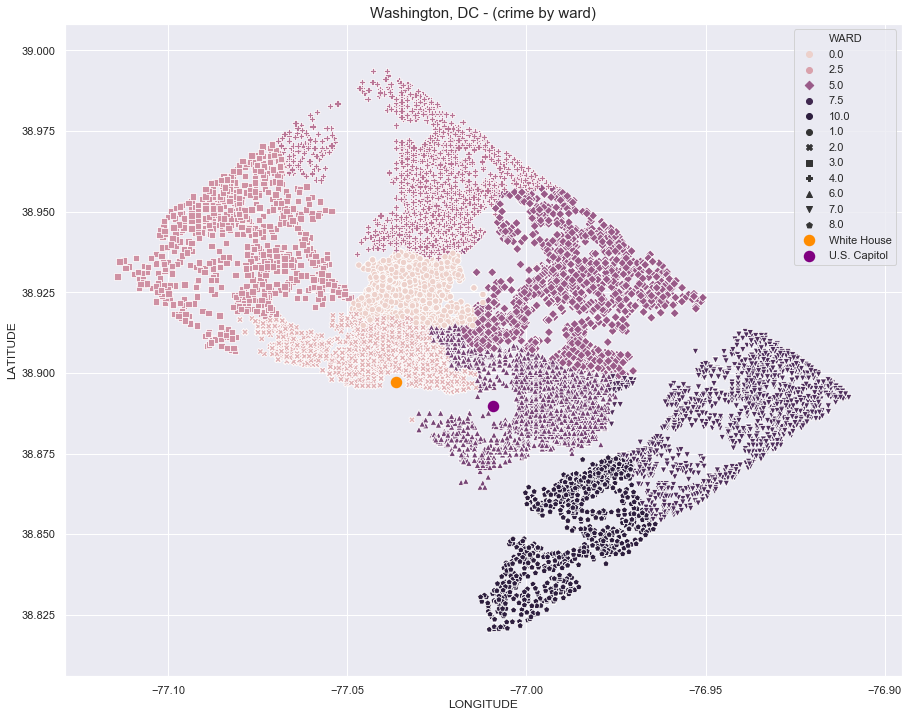

In [45]:
plt.figure(figsize=(15, 12))
sns.set(font_scale=1)

sns.scatterplot(df['LONGITUDE'], df['LATITUDE'], s=40, hue = df_f['WARD'], style = df_f['WARD'], lw=0)

plt.scatter(-77.03654,38.89722, s = 90, color = 'darkorange', lw=2, label = 'White House')
plt.scatter(-77.00937,38.88968,s = 90, color = 'purple', lw=2, label = 'U.S. Capitol')

plt.title('Washington, DC - (crime by ward)', size = 15)
plt.legend()
plt.show()

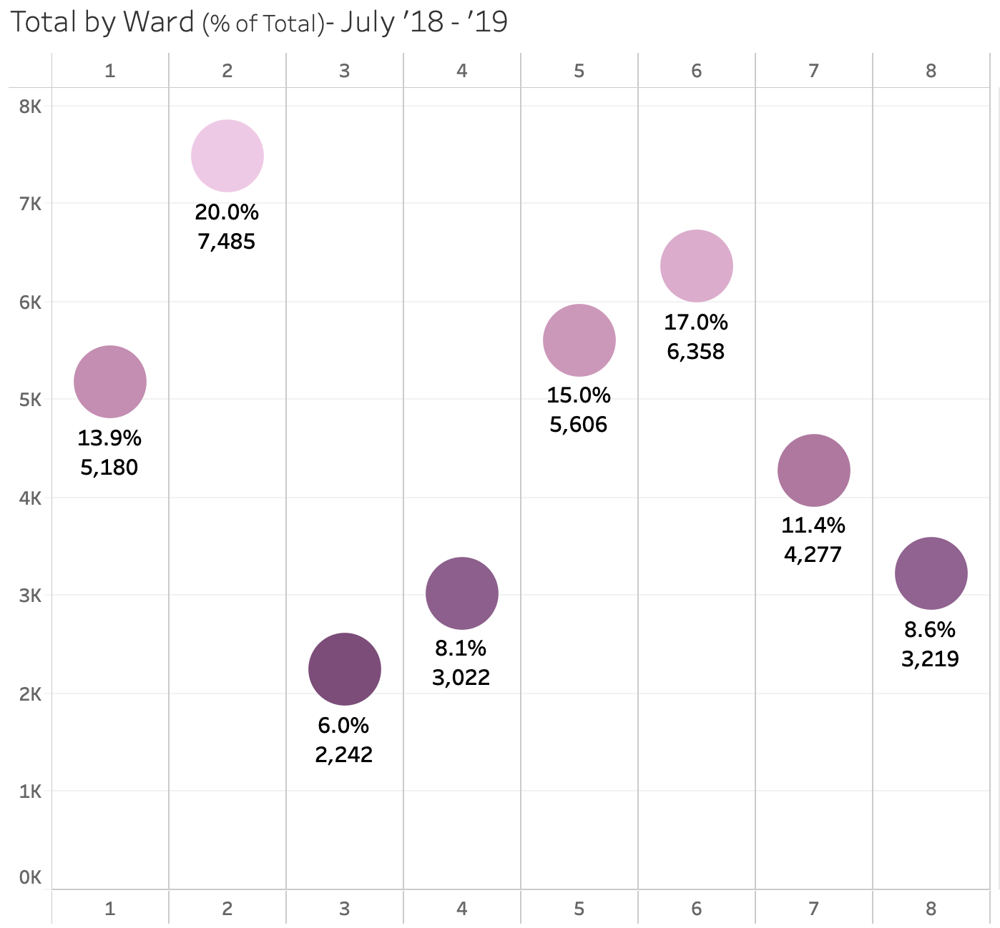

In [43]:
Image(filename = 'DC Crime by Ward.png', 
      width=600, height=600, )

We generated a heatmap depicting the distribution of crime events within DC:

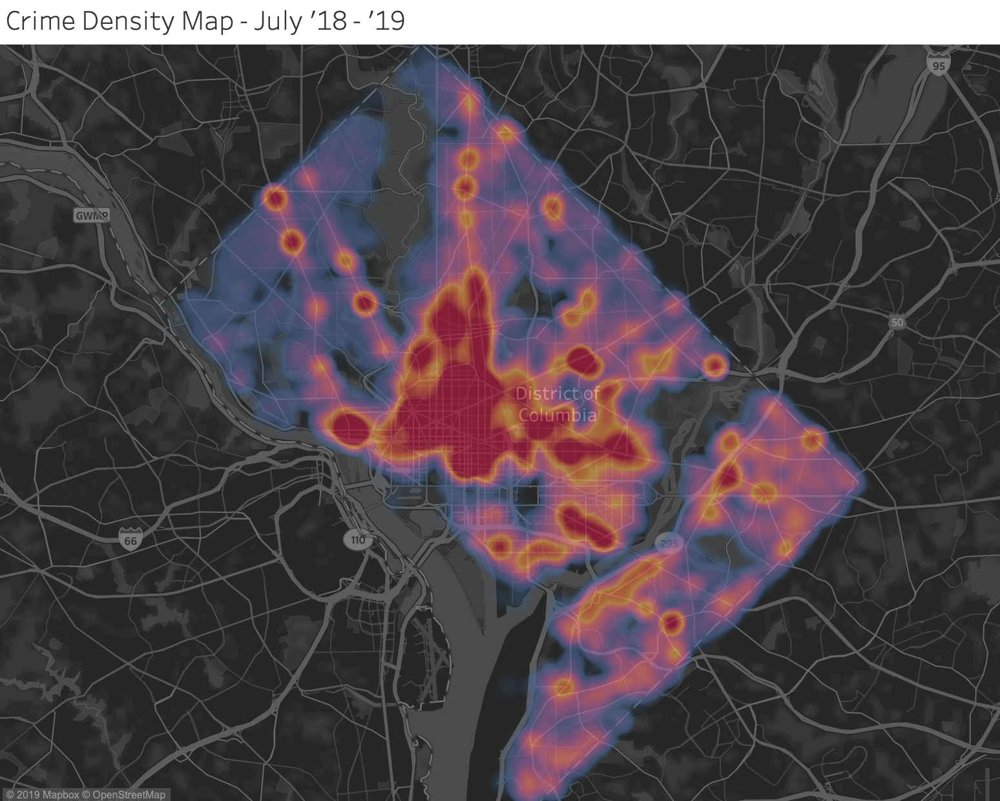

In [21]:
Image(filename = 'DC Crime Heatmap.png',width=1000, height=900, )

And finally, we visualize the day, location and type of crime committed with adjustable parameters between July '18 - '19:

In [42]:
%%HTML

<div class='tableauPlaceholder' id='viz1566841067677' style='position: relative'><noscript><a href='#'><img alt=' ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;DC&#47;DCCrimeMap_15668370887560&#47;IncidentAnimationfiltered&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='DCCrimeMap_15668370887560&#47;IncidentAnimationfiltered' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;DC&#47;DCCrimeMap_15668370887560&#47;IncidentAnimationfiltered&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1566841067677');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='100%';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>